# DAP Project : Electric vehicle 

### 1. Loading Raw Data

**1.1 Fetch raw data from API**

In [1]:
from sodapy import Socrata
def api_data_fetch(domain, app_token, key):
    client = Socrata(domain, app_token)
    data = client.get(key , limit= 1000000)
    return data

In [2]:
raw_Data_1 = api_data_fetch("data.wa.gov","rQ5gEd1bMW5mkYuGmH3mUsgAA","rpr4-cgyd")
raw_Data_2 = api_data_fetch("data.wa.gov",None,"f6w7-q2d2")

**1.2 importing GeoJson data**

In [3]:
import json

with open("Alternative_Fueling_Stations.geojson",encoding="utf-8") as f:
    geo_Json = json.load(f)
    
length = len(geo_Json['features'])
raw_Data_3 = []
for i in range(length):
    raw_Data_3.append(geo_Json["features"][i]["properties"])

### 2. Raw data Insert and extraction from MongoDB DataBase using Docker and coverting into dataframe.

In [4]:
from pymongo import MongoClient
import pandas as pd

def create_dataframe_MongoDB (client_name, collection_name, data):
    
    # Connect to the MongoDB container
    client = MongoClient("mongodb://%s:%s@127.0.0.1" % ("dap", "dap"))
    
    # Get the database
    db = client[client_name]
    
    # Get the collection
    collection = db[collection_name]
    
    # Delete all the documents in the collection.
    collection.drop()
    
    # Insert data
    result = collection.insert_many(data)
    
    # Retrieve data and create DataFrame
    fetched_Data = []
    for doc in collection.find():
        fetched_Data.append(doc)
        
    # Close the connection
    client.close()
    
    # Prepared the dataframe
    dataframe = pd.DataFrame(fetched_Data)
    
    #Returing the dataframe
    return dataframe

**2.1 Creating Dataframe using the above created function for Dataset 1**

In [5]:
EV_Registration_DF = create_dataframe_MongoDB ('EV_database','EV_Registration', raw_Data_1)
EV_Registration_DF.head(5)
print("Shape of the dataframe :",EV_Registration_DF.shape)

Shape of the dataframe : (698797, 36)


**2.2 Creating Dataframe using the above created function for Dataset 2**

In [6]:
EV_Population_DF = create_dataframe_MongoDB ('EV_database','EV_population', raw_Data_2)
EV_Population_DF.head(5)
print("Shape of the dataframe :",EV_Population_DF.shape)

Shape of the dataframe : (124716, 21)


**2.3 Creating Dataframe using the above created function for Dataset 3**

In [7]:
Fuel_Station_location_DF = create_dataframe_MongoDB ('EV_database','Fuel_Station111', raw_Data_3)
Fuel_Station_location_DF.head(5)
print("Shape of the dataframe :",Fuel_Station_location_DF.shape)

Shape of the dataframe : (71464, 76)


## 3. Data preprocessing & cleaning -

### 3.1. EV Registration data

In [8]:
EV_Registration_DF = EV_Registration_DF.loc[:, ['electric_vehicle_type','dol_vehicle_id','make','model','vehicle_primary_use','electric_range','new_or_used_vehicle', 'transaction_year', 'city', 'state_of_residence']]
EV_Registration_DF.head(5)

,electric_vehicle_type,dol_vehicle_id,make,model,vehicle_primary_use,electric_range,new_or_used_vehicle,transaction_year,city,state_of_residence
0,Plug-in Hybrid Electric Vehicle (PHEV),475357858,VOLVO,XC60,Passenger,17,Used,2021,BELLEVUE,WA
1,Battery Electric Vehicle (BEV),207290751,NISSAN,Leaf,Passenger,150,Used,2022,BELLEVUE,WA
2,Battery Electric Vehicle (BEV),207290751,NISSAN,Leaf,Passenger,150,Used,2022,BELLEVUE,WA
3,Battery Electric Vehicle (BEV),204874379,TESLA,Model 3,Passenger,215,Used,2019,BELLEVUE,WA
4,Plug-in Hybrid Electric Vehicle (PHEV),192575253,CHEVROLET,Volt,Passenger,53,Used,2017,BELLEVUE,WA


In [9]:
# Converting the Uppercase values to Camle case.
EV_Registration_DF['city'] = EV_Registration_DF['city'].str.title()

In [10]:
# Arrange the city column into ascending order.
EV_Registration_DF = EV_Registration_DF.sort_values(by=['city'], ascending=True)

In [11]:
#Checking Datatype of all the selected columns:
print(EV_Registration_DF.dtypes)

electric_vehicle_type    object
dol_vehicle_id           object
make                     object
model                    object
vehicle_primary_use      object
electric_range           object
new_or_used_vehicle      object
transaction_year         object
city                     object
state_of_residence       object
dtype: object


In [12]:
# Converting the columns which contains integer from object to int
EV_Registration_DF['dol_vehicle_id'] = EV_Registration_DF['dol_vehicle_id'].astype(int)
EV_Registration_DF['electric_range'] = EV_Registration_DF['electric_range'].astype(int)
EV_Registration_DF['transaction_year'] = EV_Registration_DF['transaction_year'].astype(int)

In [13]:
#Checking and handling Null Values in the dataset:

print("Missing values:\n", EV_Registration_DF.isnull().sum())

Missing values:
 electric_vehicle_type      0
dol_vehicle_id             0
make                       0
model                    359
vehicle_primary_use        0
electric_range             0
new_or_used_vehicle        0
transaction_year           0
city                      69
state_of_residence         1
dtype: int64


In [14]:
# Remove null values from specific columns
EV_Registration_DF = EV_Registration_DF.dropna(subset=['model'])
EV_Registration_DF = EV_Registration_DF.dropna(subset=['city'])
EV_Registration_DF = EV_Registration_DF.dropna(subset=['state_of_residence'])

In [15]:
print("Missing values:\n", EV_Registration_DF.isnull().sum())

Missing values:
 electric_vehicle_type    0
dol_vehicle_id           0
make                     0
model                    0
vehicle_primary_use      0
electric_range           0
new_or_used_vehicle      0
transaction_year         0
city                     0
state_of_residence       0
dtype: int64


In [16]:
# Removing value "Used" from the new/used columns as it is not required for analysis.

a = 0
for i in EV_Registration_DF["new_or_used_vehicle"]:
    if i == 'Used':
        a += 1
print(a)

447573


In [17]:
# Removing Used value from the New/Used column from the data as it is not required.

EV_Registration_DF['new_or_used_vehicle'].replace(to_replace = 'Used', value = pd.NA, inplace=True)

In [18]:
EV_Registration_DF = EV_Registration_DF.dropna(subset=['new_or_used_vehicle'])

In [19]:
#Checking and removing 0 from all the columns and rows. 

if (EV_Registration_DF['electric_range'] == 0).any():
  print('Any values in "electric_range" column are zero')
else:
  print('Any values in electric_range column are not zero')

Any values in "electric_range" column are zero


In [20]:
# In the range column, there was 0 in many records so to indentify and change it with null we used below code.

Unique_zero =EV_Registration_DF[~(EV_Registration_DF == 0).any(axis=1)]

In [21]:
#checking the '0' in the range column

if (EV_Registration_DF['electric_range'] == 0).all():
  print('Aany values in electric_range column are zero')
else:
  print('Any values in electric_range column are not zero')

Any values in electric_range column are not zero


In [22]:
print("Missing values:\n", EV_Registration_DF.isnull().sum())

Missing values:
 electric_vehicle_type    0
dol_vehicle_id           0
make                     0
model                    0
vehicle_primary_use      0
electric_range           0
new_or_used_vehicle      0
transaction_year         0
city                     0
state_of_residence       0
dtype: int64


In [23]:
#removing the duplicate entries of the rows:

EV_Registration_DF = pd.DataFrame(Unique_zero)
EV_Registration_DF = EV_Registration_DF.drop_duplicates(subset = "dol_vehicle_id")

In [24]:
EV_Registration_DF.shape

(74850, 10)

In [25]:
#Changing the columns name:

EV_Registration_DF.rename(columns = {'electric_range':'KM_range_per_charge'}, inplace = True)
EV_Registration_DF.rename(columns = {'transaction_year':'registration_year'}, inplace = True)

In [26]:
column_headers = list(EV_Registration_DF.columns)
print(column_headers)

['electric_vehicle_type', 'dol_vehicle_id', 'make', 'model', 'vehicle_primary_use', 'KM_range_per_charge', 'new_or_used_vehicle', 'registration_year', 'city', 'state_of_residence']


**Load the clean data into PostGreSQL database**

In [27]:
#Connecting to Postgresql

#Connecting to postgreSQL by importing psycopg2 package and created EVPOPULATION database
import psycopg2
try:
    dbConnection = psycopg2.connect(
        user = "postgreusr",
        password = "postgrepwd",
        host = "localhost",
        port = "5432",
        database = "postgres"
    )
    dbConnection.set_isolation_level(0) # AUTOCOMMIT
    dbCursor = dbConnection.cursor()
    
    dbCursor.execute('SELECT datname FROM pg_database;')
    db_lst = dbCursor.fetchall()
    my_db = 'evpopulation'
    #Checking db exists or not
    if (my_db,) in db_lst:
        print('DB already exists')
     #   dbCursor.execute('DROP DATABASE EVPOPULATION;')
    else:
        #created EVPOPULATION db 
        dbCursor.execute('CREATE DATABASE EVPOPULATION;')
    dbCursor.close()
except (Exception , psycopg2.Error) as dbError :
    print ("Error while connecting to PostgreSQL", dbError)
finally:
    if dbConnection in locals(): 
        dbConnection.close()

DB already exists


In [28]:
# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Create a cursor
cur = conn.cursor()

# Create a table in the database
cur.execute("""
    CREATE TABLE ELECTRIC_VEHICLE_REGIST (
        electric_vehicle_type varchar(50),
        dol_vehicle_id int,
        make varchar(50),
        model varchar(50),
        vehicle_primary_use varchar(60),
        KM_range_per_charge varchar(60),
        new_or_used_vehicle varchar(60),
        registration_year int,
        city varchar(60),
        state_of_residence varchar(60)
    );
""")

# Commit the changes
conn.commit()

# Insert the data into the table
for i, row in EV_Registration_DF.iterrows():
    cur.execute("""
        INSERT INTO ELECTRIC_VEHICLE_REGIST (electric_vehicle_type, dol_vehicle_id, make, model, vehicle_primary_use, KM_range_per_charge, new_or_used_vehicle, registration_year,city, state_of_residence)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s,%s,%s);
    """, (
        row['electric_vehicle_type'],
        row['dol_vehicle_id'],
        row['make'],
        row['model'],
        row['vehicle_primary_use'],
        row['KM_range_per_charge'],
        row['new_or_used_vehicle'],
        row['registration_year'],
        row['city'],
        row['state_of_residence']
    ))

# Commit the changes
conn.commit()

# Close the cursor and connection
cur.close()
conn.close()

### 3.2. EV population data.

In [29]:
EV_Population_DF = EV_Population_DF.drop(['_id','vin_1_10', 'zip_code', 'cafv_type', 'electric_range', 'base_msrp', 'legislative_district', 'dol_vehicle_id',
                    'geocoded_column','_2020_census_tract',':@computed_region_x4ys_rtnd',':@computed_region_fny7_vc3j',
                   ':@computed_region_8ddd_yn5v'], axis=1)

In [30]:
EV_Population_DF.head(5)

,county,city,state,model_year,make,model,ev_type,electric_utility
0,Yakima,Yakima,WA,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),PACIFICORP
1,San Diego,San Diego,CA,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),NaN
2,Lane,Eugene,OR,2021,VOLVO,S60,Plug-in Hybrid Electric Vehicle (PHEV),NaN
3,Yakima,Yakima,WA,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),PACIFICORP
4,Snohomish,Bothell,WA,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),PUGET SOUND ENERGY INC


In [31]:
EV_Population_DF.dtypes

county              object
city                object
state               object
model_year          object
make                object
model               object
ev_type             object
electric_utility    object
dtype: object

In [32]:
#Checking the null values in the selected columns
null_val = EV_Population_DF.isnull().sum()
print(null_val)

county                2
city                  2
state                 0
model_year            0
make                  0
model               181
ev_type               0
electric_utility    473
dtype: int64


In [33]:
# Drop the null Value
EV_Population_DF = EV_Population_DF.dropna()

In [34]:
EV_Population_DF = EV_Population_DF.sort_values(by=['city'], ascending=True)

In [35]:
EV_Population_DF['city'].value_counts()

Seattle           21946
Bellevue           6476
Redmond            4641
Vancouver          4462
Kirkland           3920
                  ...  
Copalis Beach         1
Port Gamble           1
Plymouth              1
Bridgeport Bar        1
Matlock               1
Name: city, Length: 447, dtype: int64

**Insert the clean EV population data into PostgreSQL**

In [37]:

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Create a cursor
cur = conn.cursor()

# Create a table in the database
cur.execute("""
    CREATE TABLE EV_POPULATION_DATA (
        county varchar(50),
        city varchar(50),
        state varchar(50),
        model_year varchar(50),
        make varchar(25),
        model varchar(25),
        ev_type varchar(60),
        electric_utility varchar(120)
    );
""")

# Commit the changes
conn.commit()

# Insert the data into the table
for i, row in EV_Population_DF.iterrows():
    cur.execute("""
        INSERT INTO EV_POPULATION_DATA (county, city, state, model_year, make, model, ev_type, electric_utility)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s);
    """, (
        row['county'],
        row['city'],
        row['state'],
        row['model_year'],
        row['make'],
        row['model'],
        row['ev_type'],
        row['electric_utility']
    ))

# Commit the changes
conn.commit()

# Close the cursor and connection
cur.close()
conn.close()


### 3.3 Fuel station dataset

In [38]:
Fuel_Station_location_DF = Fuel_Station_location_DF.loc[:, ['fuel_type_code','open_date','station_name','state','city','longitude','latitude']]

In [39]:
Fuel_Station_location_DF.sample(5)

,fuel_type_code,open_date,station_name,state,city,longitude,latitude
42177,ELEC,2021-02-11T00:00:00Z,PACIFIC POWER MILLCITY LEVEL,OR,Mill City,-122.476402,44.755473
50260,ELEC,2021-11-10T00:00:00Z,CP EV STATION COLLEGE PARK 2,GA,College Park,-84.460511,33.647562
3096,ELEC,2011-03-15T00:00:00Z,Duke Energy,IN,Plainfield,-86.389400,39.709090
13833,ELEC,2018-05-10T00:00:00Z,ST. ED'S GARAGE STATION1,TX,Austin,-97.751966,30.226907
29829,ELEC,2020-08-14T00:00:00Z,SUNY BROOME SUNY BROOME #1,NY,Binghamton,-75.912654,42.135483


In [40]:
Fuel_Station_location_DF = Fuel_Station_location_DF.sort_values(by=['city'], ascending=True)

In [41]:
print(Fuel_Station_location_DF.dtypes)

fuel_type_code     object
open_date          object
station_name       object
state              object
city               object
longitude         float64
latitude          float64
dtype: object


In [42]:
# Convertion od data type.
Fuel_Station_location_DF["open_date"] = pd.to_datetime(Fuel_Station_location_DF["open_date"])
Fuel_Station_location_DF["open_date"].dtypes

datetime64[ns, UTC]

In [43]:
# Handling missing values:

print("Missing values:\n", Fuel_Station_location_DF.isnull().sum())
Fuel_Station_location_DF.dropna(inplace=True)
print("\nAfter removing missing values ---")
print("Missing values:\n", Fuel_Station_location_DF.isnull().sum())

Missing values:
 fuel_type_code      0
open_date         240
station_name        0
state              31
city                0
longitude           0
latitude            0
dtype: int64

After removing missing values ---
Missing values:
 fuel_type_code    0
open_date         0
station_name      0
state             0
city              0
longitude         0
latitude          0
dtype: int64


Feature engineering: Create new features from the existing columns that may be useful for the analysis. For example, a "year" or "month" column could be extracted from the "open_date" column to enable time-based analysis.

In [44]:
Fuel_Station_location_DF["year"] = Fuel_Station_location_DF["open_date"].dt.year
Fuel_Station_location_DF["month"] = Fuel_Station_location_DF["open_date"].dt.month

In [45]:
# define a function to remove outliers using Z-score
def remove_outliers_zscore(df, col_name):
    df = df[(df[col_name]-df[col_name].mean())/df[col_name].std() < 3]
    return df

In [46]:
# remove outliers from col1
Fuel_Station_location_DF = remove_outliers_zscore(Fuel_Station_location_DF, 'longitude')

# remove outliers from col2
Fuel_Station_location_DF = remove_outliers_zscore(Fuel_Station_location_DF, 'latitude')

In [47]:
Fuel_Station_location_DF.shape

(71101, 9)

**Insert fuel station dataset into PostgreSQL**

In [49]:

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Create a cursor
cur = conn.cursor()

# Create a table in the database
cur.execute("""
    CREATE TABLE FUEL_STN_LCTN (
        fuel_type_code varchar(100),
        open_date timestamp with time zone,
        station_name varchar(120),
        state varchar(50),
        city varchar(50),
        longitude varchar(50),
        latitude varchar(50),
        year int,
        month int
        );
""")

# Commit the changes
conn.commit()

# Insert the data into the table
for i, row in Fuel_Station_location_DF.iterrows():
    cur.execute("""
        INSERT INTO FUEL_STN_LCTN (fuel_type_code, open_date, station_name,state, city, longitude, latitude, year, month)
        VALUES (%s,%s::timestamp with time zone, %s, %s, %s, %s, %s, %s,%s);
    """, (
        row['fuel_type_code'],
        row['open_date'],
        row['station_name'],
        row['state'],
        row['city'],
        row['longitude'],
        row['latitude'],
        row['year'],
        row['month']
    ))

# Commit the changes
conn.commit()

# Close the cursor and connection
cur.close()
conn.close()


## 4. Data analysis

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

#### 4.1. EV registration data analysis

**Retrieve the dataset from PostgreSQL**

In [51]:
import psycopg2
import pandas as pd

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Define the SQL query to fetch all the rows from the table
query = "SELECT * FROM ELECTRIC_VEHICLE_REGIST"

# Execute the query and fetch the results
EV_Registration_DF = pd.read_sql(query, conn)

# Close the database connection
conn.close()

# Print the entire DataFrame
EV_Registration_DF

C:\Users\tanib\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,electric_vehicle_type,dol_vehicle_id,make,model,vehicle_primary_use,km_range_per_charge,new_or_used_vehicle,registration_year,city,state_of_residence
0,Battery Electric Vehicle (BEV),110774520,TESLA,Model Y,Passenger,291,New,2020,Aberdeen,WA
1,Plug-in Hybrid Electric Vehicle (PHEV),182939060,JEEP,Wrangler,Passenger,21,New,2021,Aberdeen,WA
2,Plug-in Hybrid Electric Vehicle (PHEV),219046243,JEEP,Wrangler,Passenger,21,New,2022,Aberdeen,WA
3,Plug-in Hybrid Electric Vehicle (PHEV),2073683,KIA,Niro,Passenger,26,New,2020,Aberdeen,WA
4,Battery Electric Vehicle (BEV),476824792,CHEVROLET,Bolt EV,Passenger,238,New,2019,Aberdeen,WA
...,...,...,...,...,...,...,...,...,...,...
74845,Battery Electric Vehicle (BEV),104180338,TESLA,Model X,Passenger,289,New,2020,Zillah,WA
74846,Battery Electric Vehicle (BEV),109909467,TESLA,Model 3,Passenger,322,New,2020,Zillah,WA
74847,Plug-in Hybrid Electric Vehicle (PHEV),154479965,BMW,X5,Passenger,30,New,2021,Zillah,WA
74848,Battery Electric Vehicle (BEV),170230959,TESLA,Model X,Passenger,238,New,2018,Zillah,WA


In [52]:
EV_Registration_DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74850 entries, 0 to 74849
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   electric_vehicle_type  74850 non-null  object
 1   dol_vehicle_id         74850 non-null  int64 
 2   make                   74850 non-null  object
 3   model                  74850 non-null  object
 4   vehicle_primary_use    74850 non-null  object
 5   km_range_per_charge    74850 non-null  object
 6   new_or_used_vehicle    74850 non-null  object
 7   registration_year      74850 non-null  int64 
 8   city                   74850 non-null  object
 9   state_of_residence     74850 non-null  object
dtypes: int64(2), object(8)
memory usage: 5.7+ MB


Total number of vehicles registered per year

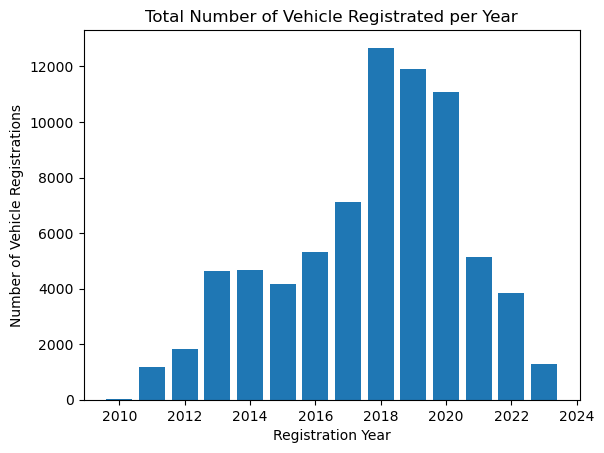

In [53]:
# Group the data by registration year and count the number of registrations
registrations_per_year = EV_Registration_DF.groupby('registration_year')['dol_vehicle_id'].count()

# Create a bar plot of the registrations per year
plt.bar(registrations_per_year.index, registrations_per_year.values)
plt.xlabel('Registration Year')
plt.ylabel('Number of Vehicle Registrations')
plt.title('Total Number of Vehicle Registrated per Year')
plt.show()

Total Electric range per KM modelwise.

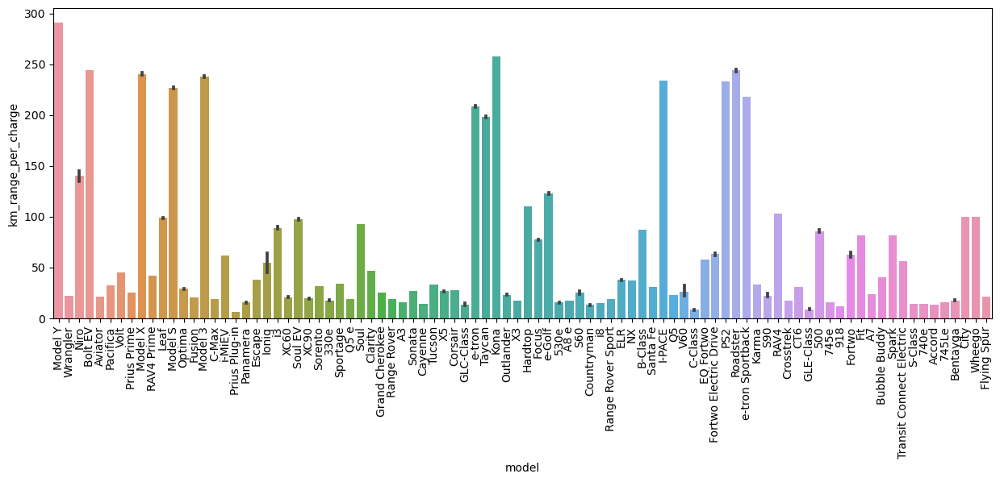

In [54]:
EV_Registration_DF['km_range_per_charge'] = EV_Registration_DF['km_range_per_charge'].astype(int)
plt.figure(figsize=(15, 5))
sns.barplot(x = 'model',y = 'km_range_per_charge',data = EV_Registration_DF)
plt.xticks(rotation=90)
plt.show()

Total share of Electric Vehicles by its type (BEV's/PHEV's)

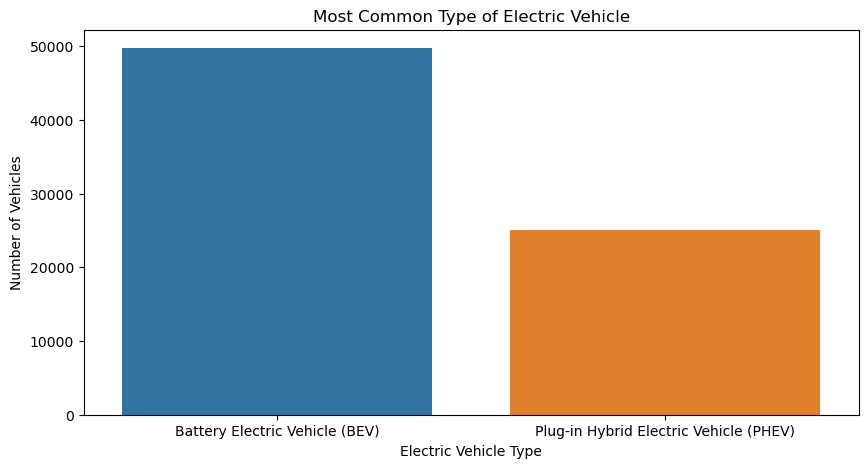

In [55]:
# count the number of occurrences of each vehicle type
vehicle_type_counts = EV_Registration_DF['electric_vehicle_type'].value_counts()

# plot the vehicle type counts
plt.figure(figsize=(10, 5))
sns.barplot(x=vehicle_type_counts.index, y=vehicle_type_counts.values)
plt.title('Most Common Type of Electric Vehicle')
plt.xlabel('Electric Vehicle Type')
plt.ylabel('Number of Vehicles')
plt.show()

Total Registration of Electric Vehicles Citywise

<AxesSubplot:>

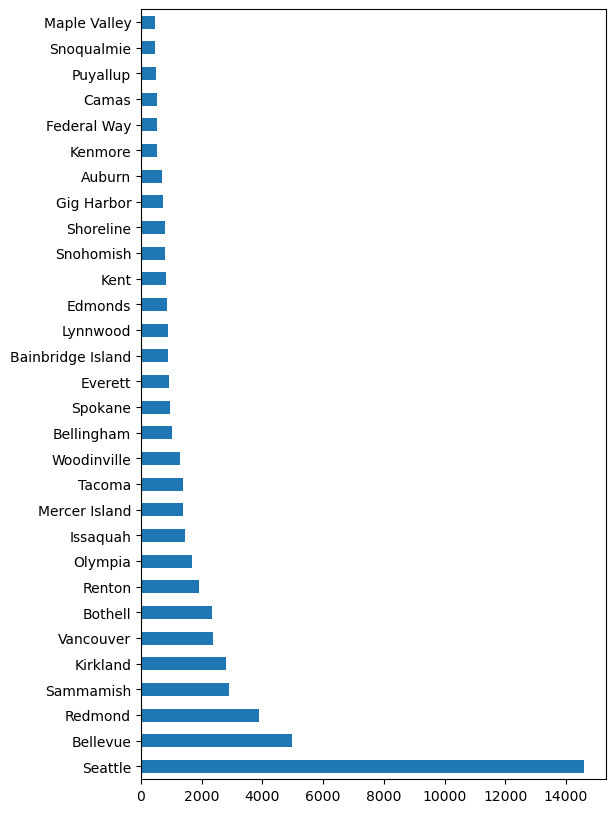

In [56]:
EV_Registration_DF['city'].value_counts().head(30).plot(kind='barh', figsize=(6,10))

Total registration of Electric Vehicles by company type

C:\Users\tanib\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, 'TESLA'),
  Text(1, 0, 'JEEP'),
  Text(2, 0, 'KIA'),
  Text(3, 0, 'CHEVROLET'),
  Text(4, 0, 'LINCOLN'),
  Text(5, 0, 'CHRYSLER'),
  Text(6, 0, 'TOYOTA'),
  Text(7, 0, 'NISSAN'),
  Text(8, 0, 'FORD'),
  Text(9, 0, 'MITSUBISHI'),
  Text(10, 0, 'PORSCHE'),
  Text(11, 0, 'HYUNDAI'),
  Text(12, 0, 'BMW'),
  Text(13, 0, 'VOLVO'),
  Text(14, 0, 'AUDI'),
  Text(15, 0, 'HONDA'),
  Text(16, 0, 'LAND ROVER'),
  Text(17, 0, 'MERCEDES-BENZ'),
  Text(18, 0, 'MINI'),
  Text(19, 0, 'VOLKSWAGEN'),
  Text(20, 0, 'CADILLAC'),
  Text(21, 0, 'LEXUS'),
  Text(22, 0, 'JAGUAR'),
  Text(23, 0, 'SMART'),
  Text(24, 0, 'POLESTAR'),
  Text(25, 0, 'FISKER'),
  Text(26, 0, 'SUBARU'),
  Text(27, 0, 'FIAT'),
  Text(28, 0, 'BUBBLE BUDDY'),
  Text(29, 0, 'AZURE DYNAMICS'),
  Text(30, 0, 'BENTLEY'),
  Text(31, 0, 'TH!NK'),
  Text(32, 0, 'WHEEGO ELECTRIC CARS'

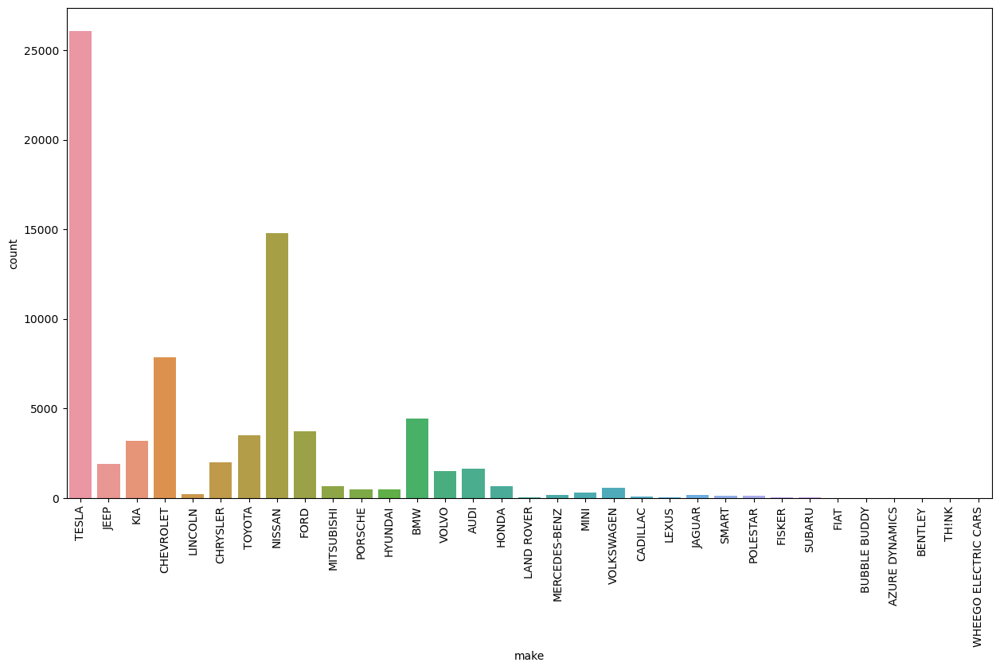

In [57]:
plt.figure(figsize=(15,8))
sns.countplot(EV_Registration_DF['make']);
plt.xticks(rotation=90)

Most registration of vehicles by model type

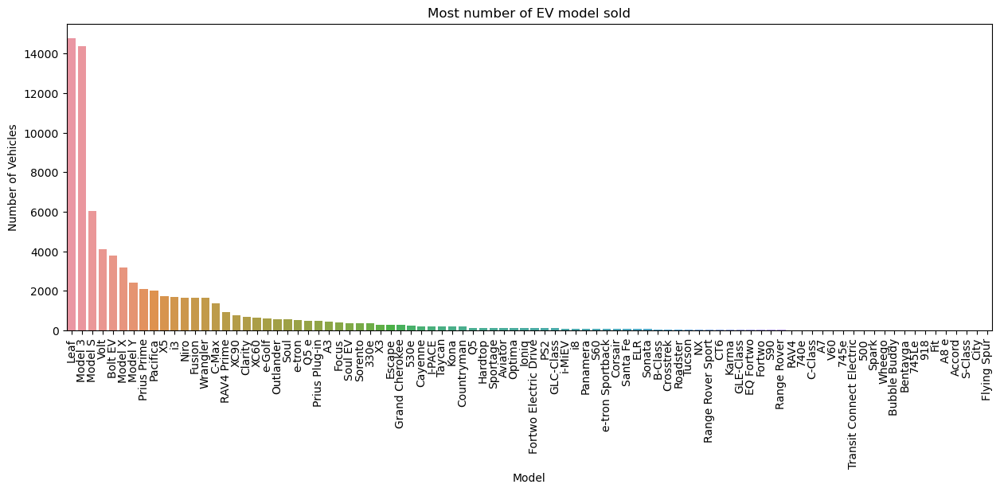

In [58]:
# count the number of occurrences of each model
vehicle_type_counts = EV_Registration_DF['model'].value_counts()

# plot the vehicle model counts
plt.figure(figsize=(15, 5))
sns.barplot(x=vehicle_type_counts.index, y=vehicle_type_counts.values)
plt.title('Most number of EV model sold')
plt.xticks(rotation=90)
plt.xlabel('Model')
plt.ylabel('Number of Vehicles')
plt.show()

## 4.2. Vehicle Population Dataset-

**Retrieve the dataset from PostGreSQL database**

In [59]:
import psycopg2
import pandas as pd

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Define the SQL query to fetch all the rows from the table
query = "SELECT * FROM EV_POPULATION_DATA"

# Execute the query and fetch the results
EV_Population_DF = pd.read_sql(query, conn)

# Close the database connection
conn.close()

# Print the entire DataFrame
EV_Population_DF


C:\Users\tanib\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,county,city,state,model_year,make,model,ev_type,electric_utility
0,Grays Harbor,Aberdeen,WA,2018,BMW,530E,Plug-in Hybrid Electric Vehicle (PHEV),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...
1,Grays Harbor,Aberdeen,WA,2019,TESLA,MODEL S,Battery Electric Vehicle (BEV),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...
2,Grays Harbor,Aberdeen,WA,2015,FORD,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...
3,Grays Harbor,Aberdeen,WA,2023,TESLA,MODEL Y,Battery Electric Vehicle (BEV),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...
4,Grays Harbor,Aberdeen,WA,2023,TESLA,MODEL 3,Battery Electric Vehicle (BEV),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...
...,...,...,...,...,...,...,...,...
124057,Yakima,Zillah,WA,2023,KIA,EV6,Battery Electric Vehicle (BEV),PACIFICORP
124058,Yakima,Zillah,WA,2012,NISSAN,LEAF,Battery Electric Vehicle (BEV),PACIFICORP
124059,Yakima,Zillah,WA,2016,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),PACIFICORP
124060,Yakima,Zillah,WA,2019,JAGUAR,I-PACE,Battery Electric Vehicle (BEV),PACIFICORP


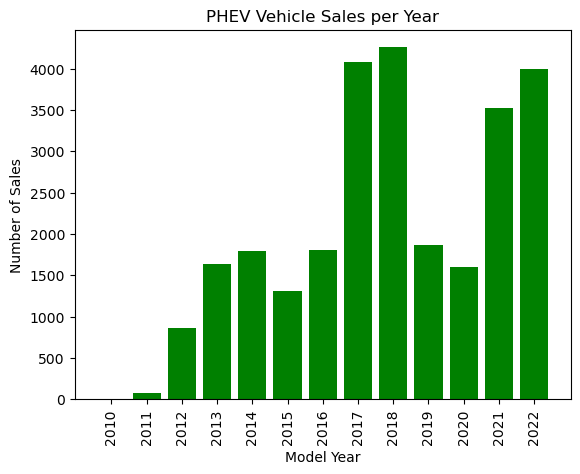

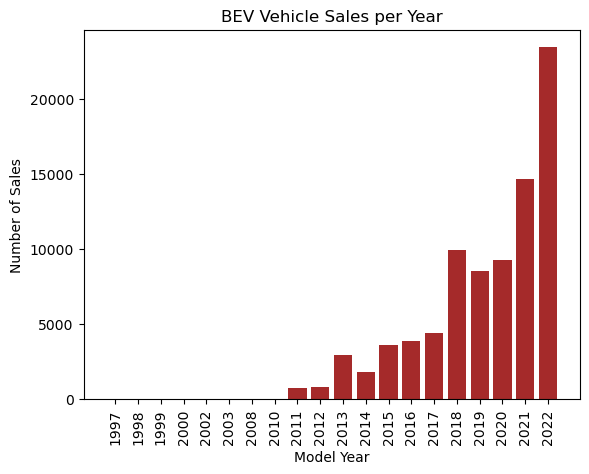

In [60]:
#EV vehicle sales per year(till 2022)
# Split the data into PHEV and BEV data frames
df_phev = EV_Population_DF[(EV_Population_DF['ev_type'] == 'Plug-in Hybrid Electric Vehicle (PHEV)') & (EV_Population_DF['model_year'] != '2023')]
df_bev = EV_Population_DF[(EV_Population_DF['ev_type'] == 'Battery Electric Vehicle (BEV)')& (EV_Population_DF['model_year'] != '2023')]

# Group the PHEV data by model_year
#The size() function is then called on the resulting groupby object to count the number of occurrences in each group.
#The reset_index(name='count') method is then called on the Series object to convert it to a DataFrame,
#with a new index column named model_year and a column named count containing the corresponding count values.
grouped_phev = df_phev.groupby(['model_year']).size().reset_index(name='count')

# Calculate the total number of PHEVs sold for each year
total_sales_phev = grouped_phev['count'].sum()

# Add a column for PHEV sales percentage for each year
grouped_phev['sales_percentage'] = (grouped_phev['count'] / total_sales_phev) * 100


# Group the BEV data by model_year
grouped_bev = df_bev.groupby(['model_year']).size().reset_index(name='count')

# Calculate the total number of BEVs sold for each year
total_sales_bev = grouped_bev['count'].sum()

# Add a column for BEV sales percentage for each year
grouped_bev['sales_percentage'] = (grouped_bev['count'] / total_sales_bev) * 100


# Create a bar chart to visualize the PHEV vehicle sales per year
plt.bar(grouped_phev['model_year'], grouped_phev['count'], color='green')
plt.title('PHEV Vehicle Sales per Year')
plt.xlabel('Model Year')
plt.xticks(rotation=90)
plt.ylabel('Number of Sales')
plt.show()


# Create a bar chart to visualize the BEV vehicle sales per year
plt.bar(grouped_bev['model_year'], grouped_bev['count'], color='brown')
plt.title('BEV Vehicle Sales per Year')
plt.xlabel('Model Year')
plt.xticks(rotation=90)
plt.ylabel('Number of Sales')
plt.show()


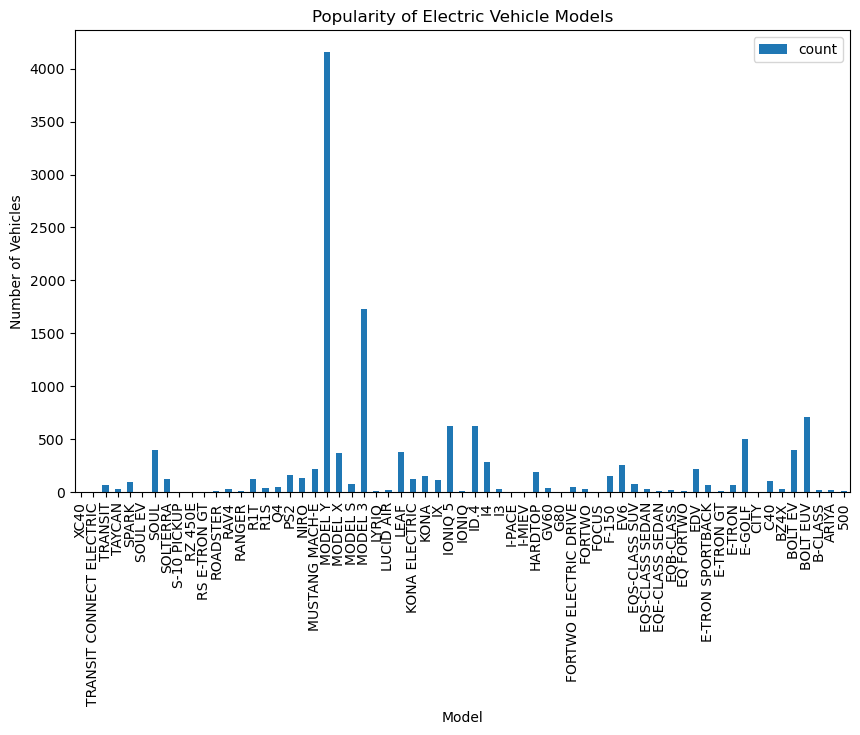

In [61]:
# Filter the data to only include electric vehicles
ev_df = EV_Population_DF[EV_Population_DF['ev_type'] == 'Battery Electric Vehicle (BEV)']

# Group the data by state, model_year, make, and model, and count the number of vehicles
grouped_df = ev_df.groupby(['state','model_year', 'make', 'model']).size().reset_index(name='count')

# Group the data by model, model_year, and count the number of vehicles
model_year_df = grouped_df.groupby(['model', 'model_year'])['count'].sum().reset_index()

# Rank the models by popularity
ranked_df = model_year_df.sort_values(['model', 'model_year'], ascending=False).groupby('model').head(1)

# Visualize the data
ranked_df.plot(kind='bar', x='model', y='count',figsize=(10, 6))
#plt.figure(figsize=(10, 6))
# Analyze the results
#print(ranked_df)
# Set the title and axis labels
plt.title('Popularity of Electric Vehicle Models')
plt.xlabel('Model')
plt.ylabel('Number of Vehicles')

# Show the plot
plt.show()

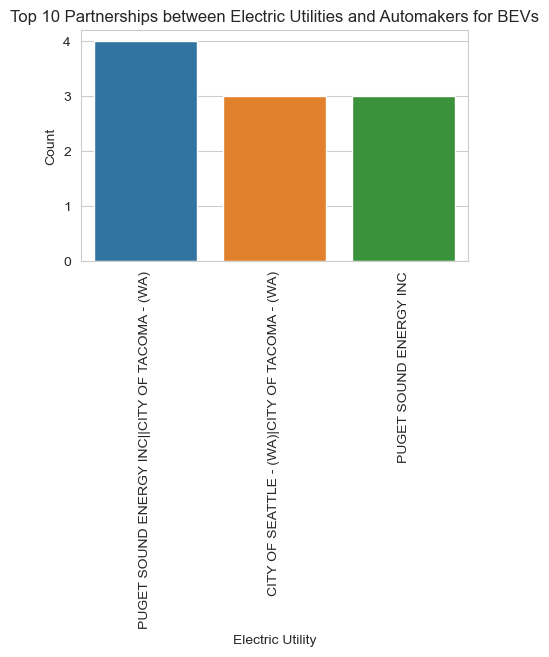

In [63]:
# Filter the data to only include Battery Electric Vehicles (BEVs)
bev_data = EV_Population_DF[EV_Population_DF['ev_type'] == 'Battery Electric Vehicle (BEV)']

# Group the data by electric utility, make, and model
grouped_data = bev_data.groupby(['electric_utility', 'make', 'model'])

# Count the number of vehicles associated with each electric utility, make, and model
count_data = grouped_data.size().reset_index(name='count')

# Sort the data by count in descending order
sorted_data = count_data.sort_values(by='count', ascending=False)

# Plot the top 10 partnerships by count
plt.figure(figsize=(5,3))
sns.set_style('whitegrid')
sns.countplot(x='electric_utility', data=sorted_data.head(10))
plt.xticks(rotation=90)
plt.title('Top 10 Partnerships between Electric Utilities and Automakers for BEVs')
plt.xlabel('Electric Utility')
plt.ylabel('Count')
plt.show()
# Plot the top 10 partnerships by count as a pie chart
#plt.figure(figsize=(10,6))
#plt.title('Top 10 Partnerships between Electric Utilities and Automakers for BEVs')
##plt.pie(sorted_data.head(10)['count'], labels=sorted_data.head(10)['electric_utility'], autopct='%1.1f%%')
plt.show()

## 4.3. Fuel station dataset

**Retrieve the Data from PostGreSQL**

In [64]:
import psycopg2
import pandas as pd

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Define the SQL query to fetch all the rows from the table
query = "SELECT * FROM FUEL_STN_LCTN"

# Execute the query and fetch the results
Fuel_Station_location_DF = pd.read_sql(query, conn)

# Close the database connection
conn.close()

# Print the entire DataFrame
Fuel_Station_location_DF


C:\Users\tanib\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,fuel_type_code,open_date,station_name,state,city,longitude,latitude,year,month
0,ELEC,2022-11-08 00:00:00+00:00,First National Bank,OH,1000 E Main St.,-84.1867456211131,39.4306907550893,2022,11
1,RD,2022-11-07 00:00:00+00:00,PASO OIL CO INC,CA,ACTON,-118.1993836,34.49338207,2022,11
2,RD,2022-11-07 00:00:00+00:00,CF UNITED APRO LLC 2704730,CA,AGOURA,-118.7407807,34.14241199,2022,11
3,ELEC,2021-01-15 00:00:00+00:00,SRS-Savannah River Operations,SC,AIKEN,-81.719553,33.560417,2021,1
4,ELEC,2022-10-08 00:00:00+00:00,Kemna Auto Center,IA,ALGONA,-94.244631,43.081743,2022,10
...,...,...,...,...,...,...,...,...,...
71096,ELEC,2021-12-14 00:00:00+00:00,Venue Live Oak,FL,sarasota,-82.451275,27.310003,2021,12
71097,ELEC,2020-11-23 00:00:00+00:00,1100 Cornwall Charging stations,NJ,south Brunswick,-74.530032,40.416789,2020,11
71098,ELEC,2017-07-14 00:00:00+00:00,GCU STATION 1,WA,spokane,-117.434917,47.652783,2017,7
71099,ELEC,2022-06-03 00:00:00+00:00,LOT #1444444444 PEG,PA,upper darby,-75.263087,39.959976,2022,6


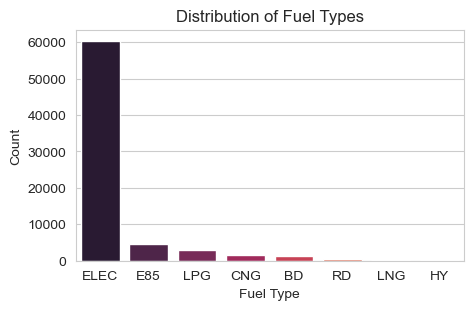

In [65]:
fuel_types = Fuel_Station_location_DF['fuel_type_code'].value_counts()
plt.figure(figsize=(5,3))
sns.barplot(x=fuel_types.index, y=fuel_types.values, palette='rocket')
plt.title('Distribution of Fuel Types')
plt.xlabel('Fuel Type')
plt.ylabel('Count')
plt.show()

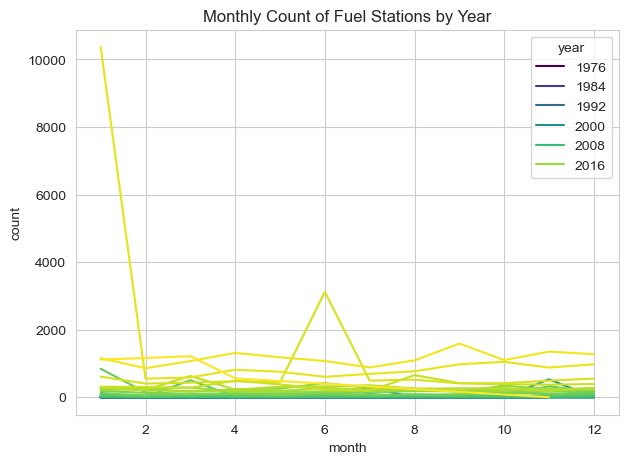

In [66]:
df_monthly_count = Fuel_Station_location_DF.groupby(["year", "month"]).size().reset_index(name="count")
plt.figure(figsize=(7, 5))
sns.lineplot(x="month", y="count", hue="year", data=df_monthly_count, palette='viridis')
plt.title("Monthly Count of Fuel Stations by Year")
plt.show()

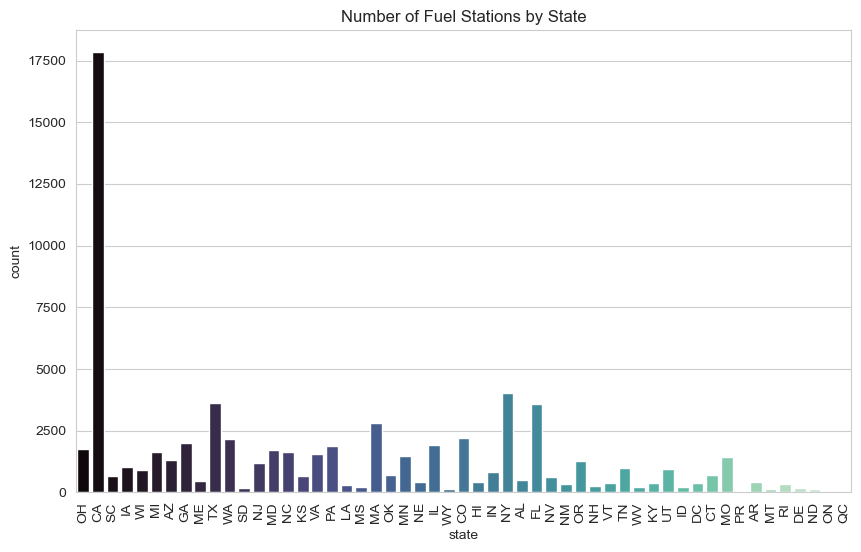

In [67]:
plt.figure(figsize=(10, 6))
sns.countplot(x="state", data=Fuel_Station_location_DF,palette= 'mako')
plt.title("Number of Fuel Stations by State")
plt.xticks(rotation=90)
plt.show()

In [68]:
import plotly.express as px
Fuel_Station_location_DF['latitude'] = Fuel_Station_location_DF['latitude'].astype(float)
Fuel_Station_location_DF['longitude'] = Fuel_Station_location_DF['longitude'].astype(float)
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(Fuel_Station_location_DF, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="station_name", 
                        #hover_data=["station_name"],
                        color="fuel_type_code",
                        color_continuous_scale=color_scale,
                        #size="fuel_type_code",
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## 5. Mergerd the dataset

**5.1. Used groupby function to calculate total registration.**

In [70]:
grouped_df_registration = EV_Registration_DF.groupby('city')

registration_year = grouped_df_registration['registration_year'].count()
registration_year = registration_year.reset_index()
registration_year = registration_year.rename(columns={"registration_year": "total_registered"})
registration_year.head(5)

,city,total_registered
0,Aberdeen,54
1,Acme,3
2,Addy,1
3,Airway Heights,12
4,Albany,1


**5.2. Used groupby function to calculate total registration.**

In [71]:
grouped_df_population = EV_Population_DF.groupby('city')

total_vehicle_population = grouped_df_population['model'].count()
total_vehicle_population = total_vehicle_population.reset_index()
total_vehicle_population = total_vehicle_population.rename(columns={"model": "total_vehicle_population"})
total_vehicle_population.head(5)

,city,total_vehicle_population
0,Aberdeen,112
1,Acme,6
2,Addy,3
3,Airway Heights,16
4,Alderdale,1


**5.3. Used groupby function to calculate total charging station.**

In [73]:
grouped_df_fuelstation = Fuel_Station_location_DF.groupby('city')

station_name = grouped_df_fuelstation['station_name'].count()
station_name = station_name.reset_index()
station_name = station_name.rename(columns={"station_name": "total_charging_station"})
print(station_name.shape)
station_name.head(5)

(7575, 2)


,city,total_charging_station
0,1000 E Main St.,1
1,ACTON,1
2,AGOURA,1
3,AIKEN,1
4,ALGONA,1


**5.4. Merged 3 dataset.**

In [74]:
#Merging station_name data and registration_year data using left join on city column.
merged_df = pd.merge(station_name, registration_year, on='city', how='left')
merged_df =merged_df.dropna()
merged_df.head(5)

,city,total_charging_station,total_registered
25,Aberdeen,29,54.0
34,Acme,3,3.0
57,Airway Heights,7,12.0
69,Albany,208,1.0
80,Aldie,1,1.0


In [75]:
#Merging above formed merged dataframe with total_vehicle_population data on city column using right join.
final_df = pd.merge(merged_df,total_vehicle_population,  on='city', how='right')
final_df = final_df.dropna()

In [76]:
final_df.head(5)

,city,total_charging_station,total_registered,total_vehicle_population
0,Aberdeen,29.0,54.0,112
1,Acme,3.0,3.0,6
3,Airway Heights,7.0,12.0,16
5,Algona,3.0,8.0,23
8,Amboy,2.0,12.0,18


In [77]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 236 entries, 0 to 446
Data columns (total 4 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   city                      236 non-null    object 
 1   total_charging_station    236 non-null    float64
 2   total_registered          236 non-null    float64
 3   total_vehicle_population  236 non-null    int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 9.2+ KB


**5.5.Loading Merged dataset into in PostgreSQL database.**

In [83]:

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Create a cursor
cur = conn.cursor()

# Create a table in the database
cur.execute("""
    CREATE TABLE MERGED_DATA (
        city varchar(120),
        total_charging_station varchar(50),
        total_registered varchar(50),
        total_vehicle_population int
         );
""")

# Commit the changes
conn.commit()

# Insert the data into the table
for i, row in final_df.iterrows():
    cur.execute("""
        INSERT INTO MERGED_DATA (city, total_charging_station, total_registered, total_vehicle_population)
        VALUES (%s, %s, %s, %s);
    """, (
        row['city'],
        row['total_charging_station'],
        row['total_registered'],
        row['total_vehicle_population']
    ))

# Commit the changes
conn.commit()

# Close the cursor and connection
cur.close()
conn.close()


**5.6 Retrieving data from PostgreSQL**

In [85]:
import psycopg2
import pandas as pd

# Connect to the PostgreSQL database
conn = psycopg2.connect(
    host="localhost",
    database="evpopulation",
    user="postgreusr",
    password="postgrepwd"
)

# Define the SQL query to fetch all the rows from the table
query = "SELECT * FROM MERGED_DATA"

# Execute the query and fetch the results
final_df = pd.read_sql(query, conn)

# Close the database connection
conn.close()

C:\Users\tanib\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning:

pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy



In [90]:
final_df

,city,total_charging_station,total_registered,total_vehicle_population
0,Aberdeen,29.0,54.0,112
1,Acme,3.0,3.0,6
2,Airway Heights,7.0,12.0,16
3,Algona,3.0,8.0,23
4,Amboy,2.0,12.0,18
...,...,...,...,...
231,Woodland,36.0,70.0,119
232,Woodway,1.0,73.0,73
233,Yakima,18.0,199.0,455
234,Yelm,1.0,112.0,189


**5.7. Data visualization on merged dataset**

In [96]:
final_df['total_vehicle_population'] = final_df['total_vehicle_population'].astype(int)

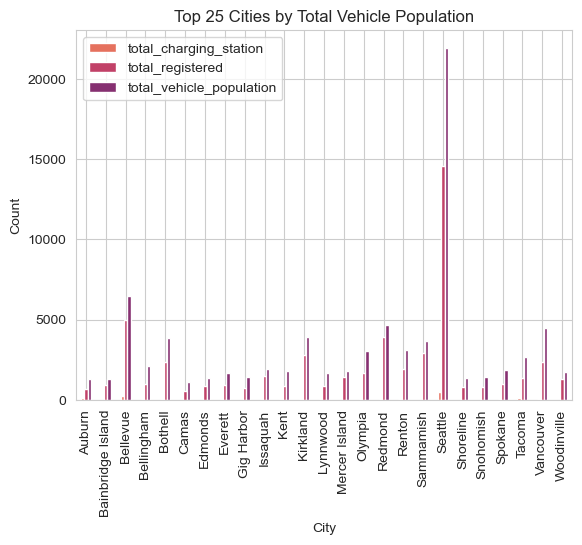

<Figure size 1000x500 with 0 Axes>

In [97]:
top_cities = final_df.sort_values('total_vehicle_population', ascending=False).head(25)['city']
top_df = final_df[final_df['city'].isin(top_cities)]
colors = sns.color_palette("flare", n_colors=3)
top_df.set_index('city')[['total_charging_station', 'total_registered', 'total_vehicle_population']].plot(kind='bar',color = colors)
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Top 25 Cities by Total Vehicle Population')
plt.figure(figsize=(10, 5))
plt.show()

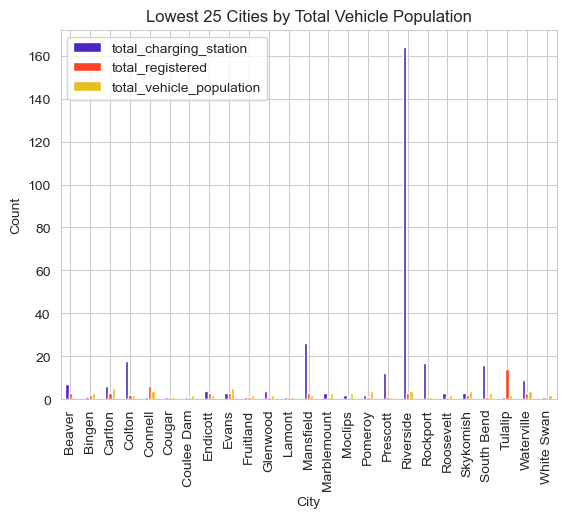

In [98]:
lowest_cities = final_df.sort_values('total_vehicle_population', ascending=False).tail(25)['city']
low_df = final_df[final_df['city'].isin(lowest_cities)]
colors = sns.color_palette("CMRmap", n_colors=3)
low_df.set_index('city')[['total_charging_station', 'total_registered', 'total_vehicle_population']].plot(kind='bar', color=colors)
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Lowest 25 Cities by Total Vehicle Population')
plt.show()

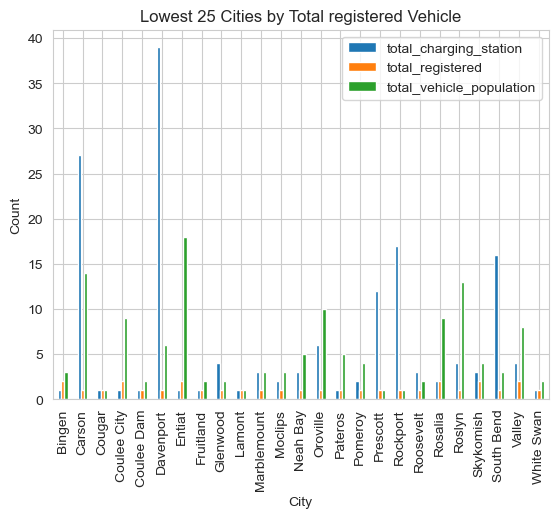

<Figure size 1000x500 with 0 Axes>

In [99]:
low_cities = final_df.sort_values('total_registered', ascending=True).head(25)['city']
low_df = final_df[final_df['city'].isin(low_cities)]
low_df.set_index('city')[['total_charging_station', 'total_registered', 'total_vehicle_population']].plot(kind='bar')
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Lowest 25 Cities by Total registered Vehicle')
plt.figure(figsize=(10, 5))
plt.show()

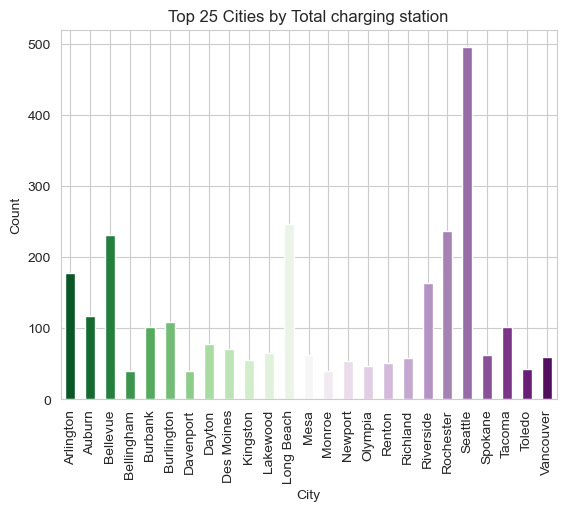

<Figure size 1000x500 with 0 Axes>

In [100]:
top_cities = final_df.sort_values('total_charging_station', ascending=False).head(25)['city']
top_df = final_df[final_df['city'].isin(top_cities)]
colors = sns.color_palette("PRGn_r", n_colors=25)
top_df.set_index('city')['total_charging_station'].plot(kind='bar', color=colors)
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Top 25 Cities by Total charging station')
plt.figure(figsize=(10, 5))
plt.show()